In [21]:
#Importing required packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import skew,kurtosis

In [22]:
#Reading dataset
data=pd.read_csv('data.csv')
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [24]:
#Dropping columns by domain knowledge
del_features=['Id','Street','Alley','Utilities','Condition2','RoofMatl','2ndFlrSF','Exterior2nd','MasVnrType','MasVnrArea','ExterCond','BsmtQual','BsmtFinType2','BsmtFinSF2','Heating','LowQualFinSF','BsmtFullBath','BsmtHalfBath','HalfBath','Functional','FireplaceQu','GarageCond','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','PoolQC','Fence','MiscFeature','MiscVal']
data.drop(del_features,inplace=True,axis=1)
data

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,ExterQual,Foundation,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,PavedDrive,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,Gd,PConc,TA,No,GLQ,706,150,856,Ex,Y,SBrkr,856,1710,2,3,1,Gd,8,0,Attchd,2003.0,RFn,2,548,TA,Y,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,TA,CBlock,TA,Gd,ALQ,978,284,1262,Ex,Y,SBrkr,1262,1262,2,3,1,TA,6,1,Attchd,1976.0,RFn,2,460,TA,Y,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,Gd,PConc,TA,Mn,GLQ,486,434,920,Ex,Y,SBrkr,920,1786,2,3,1,Gd,6,1,Attchd,2001.0,RFn,2,608,TA,Y,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,TA,BrkTil,Gd,No,ALQ,216,540,756,Gd,Y,SBrkr,961,1717,1,3,1,Gd,7,1,Detchd,1998.0,Unf,3,642,TA,Y,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,Gd,PConc,TA,Av,GLQ,655,490,1145,Ex,Y,SBrkr,1145,2198,2,4,1,Gd,9,1,Attchd,2000.0,RFn,3,836,TA,Y,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Lvl,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,TA,Wood,TA,No,GLQ,732,64,796,Ex,Y,SBrkr,796,1362,1,1,1,TA,5,0,Attchd,1993.0,Unf,2,480,TA,Y,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Lvl,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,Gd,PConc,TA,Av,GLQ,1369,317,1686,Ex,Y,SBrkr,1694,1694,2,3,1,Gd,7,1,Attchd,2004.0,RFn,2,636,TA,Y,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Lvl,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,TA,CBlock,TA,Mn,ALQ,859,216,1107,Ex,Y,SBrkr,1107,2090,2,3,1,TA,7,2,Attchd,1973.0,RFn,2,484,TA,Y,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Lvl,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,TA,BrkTil,TA,No,Unf,0,952,952,Gd,Y,FuseF,1022,1774,2,2,2,TA,8,2,Detchd,1931.0,Unf,2,468,Fa,Y,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Lvl,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,TA,BrkTil,TA,No,GLQ,851,140,991,Ex,Y,SBrkr,1077,1077,1,2,2,TA,5,2,Attchd,1939.0,RFn,1,205,Gd,Y,1,2008,WD,Normal,118000


In [25]:
#Filling zeros with mean for the columns which contains highest number of zeros
data['BsmtFinSF1'].replace(0,data['BsmtFinSF1'].mean(),inplace=True)
data['BsmtUnfSF'].replace(0,data['BsmtUnfSF'].mean(),inplace=True)
data['TotalBsmtSF'].replace(0,data['TotalBsmtSF'].mean(),inplace=True)

In [26]:
data

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,ExterQual,Foundation,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,PavedDrive,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,Gd,PConc,TA,No,GLQ,706.000000,150.000000,856.000000,Ex,Y,SBrkr,856,1710,2,3,1,Gd,8,0,Attchd,2003.0,RFn,2,548,TA,Y,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,TA,CBlock,TA,Gd,ALQ,978.000000,284.000000,1262.000000,Ex,Y,SBrkr,1262,1262,2,3,1,TA,6,1,Attchd,1976.0,RFn,2,460,TA,Y,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,Gd,PConc,TA,Mn,GLQ,486.000000,434.000000,920.000000,Ex,Y,SBrkr,920,1786,2,3,1,Gd,6,1,Attchd,2001.0,RFn,2,608,TA,Y,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,TA,BrkTil,Gd,No,ALQ,216.000000,540.000000,756.000000,Gd,Y,SBrkr,961,1717,1,3,1,Gd,7,1,Detchd,1998.0,Unf,3,642,TA,Y,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,Gd,PConc,TA,Av,GLQ,655.000000,490.000000,1145.000000,Ex,Y,SBrkr,1145,2198,2,4,1,Gd,9,1,Attchd,2000.0,RFn,3,836,TA,Y,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,IR1,Lvl,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,TA,Wood,TA,No,GLQ,732.000000,64.000000,796.000000,Ex,Y,SBrkr,796,1362,1,1,1,TA,5,0,Attchd,1993.0,Unf,2,480,TA,Y,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Reg,Lvl,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,Gd,PConc,TA,Av,GLQ,1369.000000,317.000000,1686.000000,Ex,Y,SBrkr,1694,1694,2,3,1,Gd,7,1,Attchd,2004.0,RFn,2,636,TA,Y,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,IR1,Lvl,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,TA,CBlock,TA,Mn,ALQ,859.000000,216.000000,1107.000000,Ex,Y,SBrkr,1107,2090,2,3,1,TA,7,2,Attchd,1973.0,RFn,2,484,TA,Y,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Reg,Lvl,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,TA,BrkTil,TA,No,Unf,443.639726,952.000000,952.000000,Gd,Y,FuseF,1022,1774,2,2,2,TA,8,2,Detchd,1931.0,Unf,2,468,Fa,Y,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Reg,Lvl,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,TA,BrkTil,TA,No,GLQ,851.000000,140.000000,991.000000,Ex,Y,SBrkr,1077,1077,1,2,2,TA,5,2,Attchd,1939.0,RFn,1,205,Gd,Y,1,2008,WD,Normal,118000


In [27]:
#Filling null values
data['BsmtExposure'] = data['BsmtExposure'].fillna(data['BsmtExposure'].mode()[0])
data['GarageType'] = data['GarageType'].fillna(data['GarageType'].mode()[0]) 
data['Electrical'] = data['Electrical'].fillna(data['Electrical'].mode()[0]) 
data['GarageQual'] = data['GarageQual'].fillna(data['GarageQual'].mode()[0])

data['BsmtCond'].replace(np.nan,'No class',inplace=True)
data['BsmtFinType1'].replace(np.nan,'No class',inplace=True)
data['GarageFinish'].replace(np.nan,'No class',inplace=True)

data['LotFrontage'].fillna(data['LotFrontage'].median(),inplace=True)
data['GarageYrBlt'].fillna(data['GarageYrBlt'].median(),inplace=True)



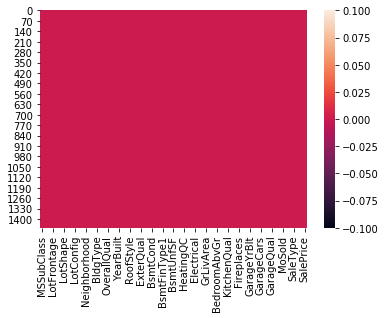

In [28]:
#Visualisation of checking null values
sns.heatmap(data.isnull())

In [29]:
#printing column names of object type
data_object=data.loc[:,data.dtypes==np.object]
data_object.columns


Index(['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle',
       'Exterior1st', 'ExterQual', 'Foundation', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'GarageType', 'GarageFinish', 'GarageQual', 'PavedDrive', 'SaleType',
       'SaleCondition'],
      dtype='object')

In [30]:
#performing Label encoding
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()
df=data.copy()
df[['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle',
       'Exterior1st', 'ExterQual', 'Foundation', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'GarageType', 'GarageFinish', 'GarageQual', 'PavedDrive', 'SaleType',
       'SaleCondition']]=df[['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle',
       'Exterior1st', 'ExterQual', 'Foundation', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'GarageType', 'GarageFinish', 'GarageQual', 'PavedDrive', 'SaleType',
       'SaleCondition']].apply(label.fit_transform)

df

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,ExterQual,Foundation,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,PavedDrive,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3,65.0,8450,3,3,4,0,5,2,0,5,7,5,2003,2003,1,12,2,2,4,3,2,706.000000,150.000000,856.000000,0,1,4,856,1710,2,3,1,2,8,0,1,2003.0,2,2,548,4,2,2,2008,8,4,208500
1,20,3,80.0,9600,3,3,2,0,24,1,0,2,6,8,1976,1976,1,8,3,1,4,1,0,978.000000,284.000000,1262.000000,0,1,4,1262,1262,2,3,1,3,6,1,1,1976.0,2,2,460,4,2,5,2007,8,4,181500
2,60,3,68.0,11250,0,3,4,0,5,2,0,5,7,5,2001,2002,1,12,2,2,4,2,2,486.000000,434.000000,920.000000,0,1,4,920,1786,2,3,1,2,6,1,1,2001.0,2,2,608,4,2,9,2008,8,4,223500
3,70,3,60.0,9550,0,3,0,0,6,2,0,5,7,5,1915,1970,1,13,3,0,1,3,0,216.000000,540.000000,756.000000,2,1,4,961,1717,1,3,1,2,7,1,5,1998.0,3,3,642,4,2,2,2006,8,0,140000
4,60,3,84.0,14260,0,3,2,0,15,2,0,5,8,5,2000,2000,1,12,2,2,4,0,2,655.000000,490.000000,1145.000000,0,1,4,1145,2198,2,4,1,2,9,1,1,2000.0,2,3,836,4,2,12,2008,8,4,250000
5,50,3,85.0,14115,0,3,4,0,11,2,0,0,5,5,1993,1995,1,12,3,5,4,3,2,732.000000,64.000000,796.000000,0,1,4,796,1362,1,1,1,3,5,0,1,1993.0,3,2,480,4,2,10,2009,8,4,143000
6,20,3,75.0,10084,3,3,4,0,21,2,0,2,8,5,2004,2005,1,12,2,2,4,0,2,1369.000000,317.000000,1686.000000,0,1,4,1694,1694,2,3,1,2,7,1,1,2004.0,2,2,636,4,2,8,2007,8,4,307000
7,60,3,69.0,10382,0,3,0,0,14,4,0,5,7,6,1973,1973,1,6,3,1,4,2,0,859.000000,216.000000,1107.000000,0,1,4,1107,2090,2,3,1,3,7,2,1,1973.0,2,2,484,4,2,11,2009,8,4,200000
8,50,4,51.0,6120,3,3,4,0,17,0,0,0,7,5,1931,1950,1,3,3,0,4,3,6,443.639726,952.000000,952.000000,2,1,1,1022,1774,2,2,2,3,8,2,5,1931.0,3,2,468,1,2,4,2008,8,0,129900
9,190,3,50.0,7420,3,3,0,0,3,0,1,1,5,6,1939,1950,1,8,3,0,4,3,2,851.000000,140.000000,991.000000,0,1,4,1077,1077,1,2,2,3,5,2,1,1939.0,2,1,205,2,2,1,2008,8,4,118000


In [31]:
X=df.iloc[:,:-1]
Y=df.iloc[:,-1]

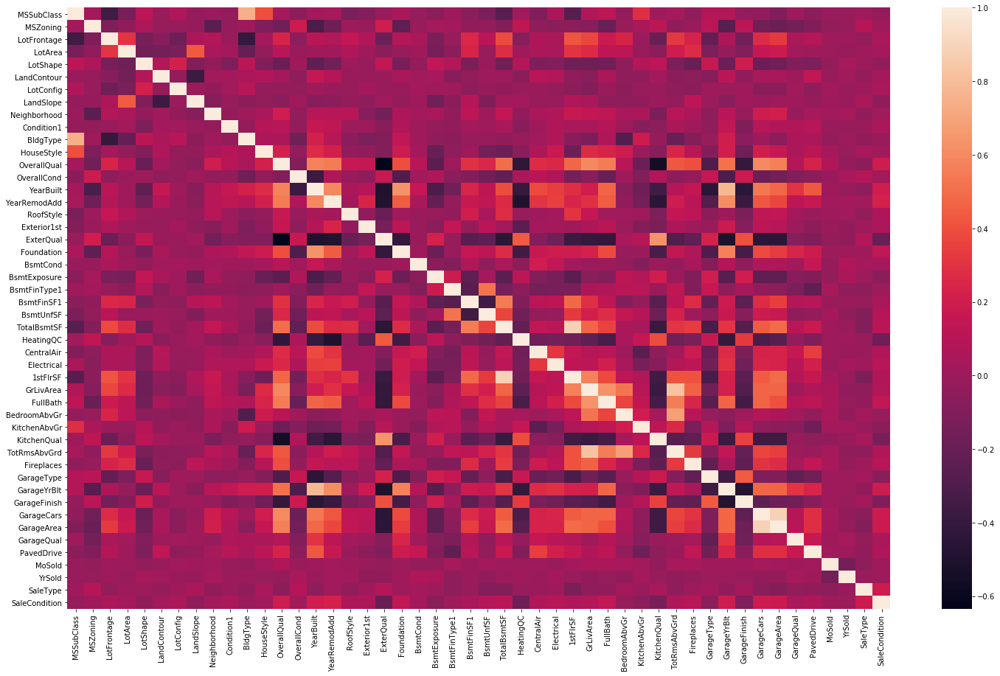

In [32]:
#Correlation
corrr=X.corr()
fig=plt.figure(figsize=(25,15))
sns.heatmap(corrr)

In [33]:
#Function to check which variables are correlated
columns = np.full((corrr.shape[0],), True)
for i in range(corrr.shape[0]):
    for j in range(i+1, corrr.shape[0]):
        if corrr.iloc[i,j] >= 0.7: #Generally correlatiob value <0.7 is considered a strong correaltion
            if columns[j]:
                columns[j] = False
                
columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True, False,
        True,  True, False,  True,  True, False,  True,  True,  True,
        True,  True,  True])

In [34]:
print(df.columns[10])
print(df.columns[29])
print(df.columns[35])
print(df.columns[38])
print(df.columns[41])

BldgType
1stFlrSF
TotRmsAbvGrd
GarageYrBlt
GarageArea


In [35]:
#Removing highly correlated features
df.drop(['BldgType','1stFlrSF','TotRmsAbvGrd','GarageYrBlt','GarageArea'],axis=1,inplace=True)


In [36]:
pd.set_option('display.max_columns', None) #to display all the columns in a dataset
pd.set_option('display.max_rows', None)
df

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,ExterQual,Foundation,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Fireplaces,GarageType,GarageFinish,GarageCars,GarageQual,PavedDrive,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3,65.0,8450,3,3,4,0,5,2,5,7,5,2003,2003,1,12,2,2,4,3,2,706.000000,150.000000,856.000000,0,1,4,1710,2,3,1,2,0,1,2,2,4,2,2,2008,8,4,208500
1,20,3,80.0,9600,3,3,2,0,24,1,2,6,8,1976,1976,1,8,3,1,4,1,0,978.000000,284.000000,1262.000000,0,1,4,1262,2,3,1,3,1,1,2,2,4,2,5,2007,8,4,181500
2,60,3,68.0,11250,0,3,4,0,5,2,5,7,5,2001,2002,1,12,2,2,4,2,2,486.000000,434.000000,920.000000,0,1,4,1786,2,3,1,2,1,1,2,2,4,2,9,2008,8,4,223500
3,70,3,60.0,9550,0,3,0,0,6,2,5,7,5,1915,1970,1,13,3,0,1,3,0,216.000000,540.000000,756.000000,2,1,4,1717,1,3,1,2,1,5,3,3,4,2,2,2006,8,0,140000
4,60,3,84.0,14260,0,3,2,0,15,2,5,8,5,2000,2000,1,12,2,2,4,0,2,655.000000,490.000000,1145.000000,0,1,4,2198,2,4,1,2,1,1,2,3,4,2,12,2008,8,4,250000
5,50,3,85.0,14115,0,3,4,0,11,2,0,5,5,1993,1995,1,12,3,5,4,3,2,732.000000,64.000000,796.000000,0,1,4,1362,1,1,1,3,0,1,3,2,4,2,10,2009,8,4,143000
6,20,3,75.0,10084,3,3,4,0,21,2,2,8,5,2004,2005,1,12,2,2,4,0,2,1369.000000,317.000000,1686.000000,0,1,4,1694,2,3,1,2,1,1,2,2,4,2,8,2007,8,4,307000
7,60,3,69.0,10382,0,3,0,0,14,4,5,7,6,1973,1973,1,6,3,1,4,2,0,859.000000,216.000000,1107.000000,0,1,4,2090,2,3,1,3,2,1,2,2,4,2,11,2009,8,4,200000
8,50,4,51.0,6120,3,3,4,0,17,0,0,7,5,1931,1950,1,3,3,0,4,3,6,443.639726,952.000000,952.000000,2,1,1,1774,2,2,2,3,2,5,3,2,1,2,4,2008,8,0,129900
9,190,3,50.0,7420,3,3,0,0,3,0,1,5,6,1939,1950,1,8,3,0,4,3,2,851.000000,140.000000,991.000000,0,1,4,1077,1,2,2,3,2,1,2,1,2,2,1,2008,8,4,118000


In [37]:
#Normality assumption
df['MSSubClass']=np.log(df['MSSubClass'])
df['LotArea']=np.log(df['LotArea'])
df['OverallQuale']=np.log(df['OverallQual'])
df['OverallCond']=np.log(df['OverallCond'])
df['BsmtFinSF1']=np.log(df['BsmtFinSF1'])
df['TotalBsmtSF']=np.log(df['TotalBsmtSF'])
df['GrLivArea']=np.log(df['GrLivArea'])
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'Exterior1st', 'ExterQual', 'Foundation', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtUnfSF',
       'TotalBsmtSF', 'HeatingQC', 'CentralAir', 'Electrical', 'GrLivArea',
       'FullBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'Fireplaces',
       'GarageType', 'GarageFinish', 'GarageCars', 'GarageQual', 'PavedDrive',
       'MoSold', 'YrSold', 'SaleType', 'SaleCondition', 'SalePrice',
       'OverallQuale'],
      dtype='object')

In [38]:
# Outlier detection/removal by Z-score
from  scipy import stats
z=np.abs(stats.zscore(df))
z

threshold=4
print(np.where(z>4))

dff=df[(z<4).all(axis=1)]
dff.shape





(array([   5,    8,    8,    9,   17,   19,   29,   30,   39,   47,   48,
         52,   62,   63,   74,   78,   83,   88,   88,   93,   93,   98,
         98,  102,  106,  109,  113,  120,  137,  144,  146,  149,  154,
        165,  166,  173,  178,  179,  181,  184,  185,  187,  188,  197,
        202,  219,  222,  224,  225,  229,  231,  236,  237,  242,  246,
        249,  249,  250,  253,  268,  271,  289,  313,  313,  314,  314,
        323,  329,  330,  335,  335,  342,  345,  375,  375,  375,  378,
        379,  383,  385,  398,  401,  410,  415,  420,  430,  440,  441,
        445,  450,  454,  456,  456,  460,  469,  482,  488,  494,  495,
        502,  505,  505,  516,  520,  529,  531,  533,  533,  537,  542,
        550,  557,  557,  567,  570,  575,  579,  586,  588,  589,  599,
        628,  630,  631,  634,  635,  635,  636,  637,  643,  651,  664,
        676,  676,  676,  677,  689,  691,  693,  699,  701,  703,  705,
        706,  706,  711,  713,  728,  728,  736,  

(1200, 45)

In [53]:
from sklearn.preprocessing import StandardScaler
scalar=StandardScaler()
scalar.fit_transform(X)

array([[ 0.07337496, -0.04553194, -0.22087509, ...,  0.13877749,
         0.31386709,  0.2085023 ],
       [-0.87256276, -0.04553194,  0.46031974, ..., -0.61443862,
         0.31386709,  0.2085023 ],
       [ 0.07337496, -0.04553194, -0.08463612, ...,  0.13877749,
         0.31386709,  0.2085023 ],
       ...,
       [ 0.30985939, -0.04553194, -0.1754621 , ...,  1.64520971,
         0.31386709,  0.2085023 ],
       [-0.87256276, -0.04553194, -0.08463612, ...,  1.64520971,
         0.31386709,  0.2085023 ],
       [-0.87256276, -0.04553194,  0.23325479, ...,  0.13877749,
         0.31386709,  0.2085023 ]])

In [56]:
#Splitting data as X and Y part
x=dff.iloc[:,:-1]
y=dff.iloc[:,-1]


In [57]:
#Splitting data as test and train part
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=10)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((960, 44), (240, 44), (960,), (240,))

In [58]:
#Modellig
from sklearn.linear_model import LinearRegression
model=LinearRegression()
model.fit(x_train,y_train)

LinearRegression()

In [59]:
#Prediction
y_predict=model.predict(x_test)

In [60]:
#Evaluation/Performace metrices
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
print(mean_squared_error(y_test,y_predict))
print(mean_absolute_error(y_test,y_predict))
print(np.sqrt(mean_squared_error(y_test,y_predict)))

0.0006253836464201508
0.018006521909128517
0.02500767175128766


In [61]:
r2_score(y_test,y_predict)

0.9864679639374136

In [62]:
adj_r2_score=1 - (1-model.score(x,y))*(len(y)-1)/(len(y)-x.shape[1]-1)
adj_r2_score

0.9866026989551576

In [63]:
model.score(x_train,y_train)

0.9872350535517782

In [64]:
model.score(x_test,y_test)

0.9864679639374136